# Bayesian ML
> Bayesian modeling of well-known distributions and simple ML algorithms.

* toc: true
* badges: true
* comments: true
* author: Zeel Patel
* categories: [ML]

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.animation import FuncAnimation
from mpl_toolkits import mplot3d
from jax import numpy as jnp, grad
import scipy

# What is the intuition behind the Bayesian update? [itempool](https://itempool.com/EnthusiasticElephant726717/live)
[admin](https://itempool.com/EnthusiasticElephant726717/live/admin)   
https://www.youtube.com/watch?v=HZGCoVF3YvM
![Steeve](https://raw.githubusercontent.com/patel-zeel/Adhoc/master/images/Screenshot%20(6).png)

![Steve](https://raw.githubusercontent.com/patel-zeel/Adhoc/master/images/Screenshot%20(7).png)

![Steve](https://raw.githubusercontent.com/patel-zeel/Adhoc/master/images/Screenshot%20(9).png)

## Bayes theorem

### $$ p(B|A) = \frac{p(A|B)}{p(A)}p(B) \to p(\theta|D) = \frac{p(D|\theta)}{p(D)}p(\theta)$$
#### * $p(D|\theta)$ - likelihood
#### * $p(\theta)$ - prior
#### * $p(D)$ - evidence
#### * $p(\theta|D)$ - posterior

#### Let us understand Likelihood, prior and evidence individually then we will move into the posterior

# But what is the Likelihood? $\to$ How likely the event is, given a belief (parameters)?

## $$
p(D|\theta)
$$

#### Let's get real with a simple coin flip experiment.

We want to determine the probability (likelihood) of $D=\{H,T,H,H,H,H,T,H,H,H\}$ after 10 coin flips believing that we have a fair coin ($p(H)=\theta=0.5$).

### $$p(D|\theta) = \prod\limits_{i=1}^{10}p(D_i|\theta) = (0.5)^8(0.5)^2 = 2^{-10}$$

More generally, out of N experiments, if we see $h$ heads, likelihood $p(D|\theta)$ is,

### $$p(D|\theta) = (\theta)^h(1-\theta)^{N-h}$$

### This likelihood is known as the "Bernoulli likelihood".

* #### $D$ event is less likely given a fair coin
* #### Your intuition isn't telling you that the coin is biased towards $H$? What's your guess for $\theta$?
* #### Let's visualize likelihood of $D$ for various values of $\theta$.

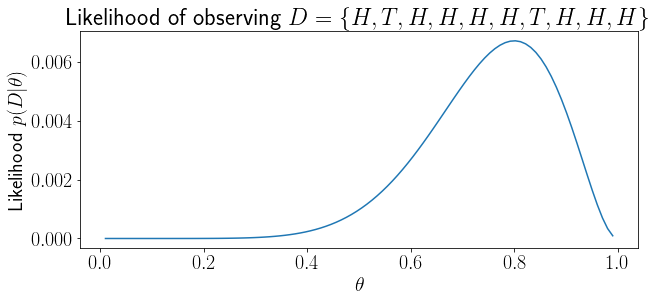

In [2]:
def Bernoulli(theta,N,h):
    return (theta**h)*((1-theta)**(N-h))
def BernoulliModified(theta,N,h): # exp after log
    return np.exp(h*np.log(theta) + (N-h)*np.log(1-theta))
def LogBernoulli(theta,N,h): # exp after log
    return h*np.log(theta) + (N-h)*np.log(1-theta)

N,h = 10,8
theta = np.linspace(0.01,0.99,100)
BL = [Bernoulli(t,N,h) for t in theta]
BLM = BernoulliModified(theta,N,h)
LogBL = LogBernoulli(theta,N,h)
rc('font',size=20)
rc('text',usetex=True)
fig, ax = plt.subplots(figsize=(10,4))
ax.plot(theta, BL);
plt.xlabel('$\\theta$');plt.ylabel('Likelihood $p(D|\\theta)$');
plt.title('Likelihood of observing $D=\{H,T,H,H,H,H,T,H,H,H\}$');

#### Visually, we can see that, our event is most likely at $\theta=0.8$. How can we concretely say that?

### Maximum likelihood estimation

* $\theta$ would be optimal at $\frac{d}{d\theta}L(D|\theta)=0$
* $\theta$ would be maximum at $\frac{d^2}{d\theta^2}L(D|\theta)<0$.

### \begin{aligned}
p(D|\theta) &= (\theta)^h(1-\theta)^{N-h}\\
\frac{d}{d\theta}p(D|\theta) &= h\theta^{h-1}(1-\theta)^{N-h} - (N-h)\theta^h(1-\theta)^{N-h-1} = 0\\
\\
\text{follows that,}\\
h(1-\theta)-(N-h)\theta &= 0\\
h - h\theta - N\theta + h\theta &= 0\\
\theta_{MLE} &= \frac{h}{H}
\end{aligned}

Verifying our example, we had $h=8$ and $N=10$, so $\theta_{MLE}=8/10=0.8$. 

#### We see from our plot that this is the maxima, but one can also verify it by double differentiation. 

### Likelihood v/s modified likelihood v/s log likelihood

* Avoiding numerical errors
### \begin{aligned}
p(D|\theta) &= (\theta)^h(1-\theta)^{N-h}\\
\\
p(D|\theta) &= \exp\left[h\log(\theta)+(N-h)\log(1-\theta)\right]\\
\\
\log p(D|theta) &= h\log(\theta)+(N-h)\log(1-\theta)\\
\end{aligned}

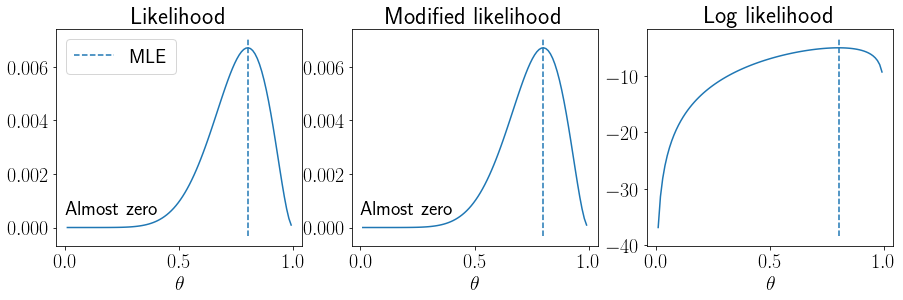

In [3]:
def Bernoulli(theta,N,h):
    return (theta**h)*((1-theta)**(N-h))
def BernoulliModified(theta,N,h): # exp after log
    return np.exp(h*np.log(theta) + (N-h)*np.log(1-theta))
def LogBernoulli(theta,N,h): # exp after log
    return h*np.log(theta) + (N-h)*np.log(1-theta)

N,h = 10,8
theta = np.linspace(0.01,0.99,100)
BL = [Bernoulli(t,N,h) for t in theta]
BLM = BernoulliModified(theta,N,h)
LogBL = LogBernoulli(theta,N,h)
rc('font',size=20)
rc('text',usetex=True)
fig, ax = plt.subplots(1,3,figsize=(15,4))
ax[0].plot(theta, BL);
ax[1].plot(theta, BLM);
ax[2].plot(theta, LogBL);
for axs in ax:
    axs.set_xlabel('$\\theta$')
    axs.vlines(0.8,*axs.get_ylim(),linestyle='--', label='MLE')
ax[0].text(0,0.0005,'Almost zero')
ax[1].text(0,0.0005,'Almost zero')
ax[0].legend()
ax[0].set_title('Likelihood');
ax[1].set_title('Modified likelihood');
ax[2].set_title('Log likelihood');

### MLE with log likelihood

* $\theta$ would be optimal at $\frac{d}{d\theta}\log L(D|\theta)=0$
* $\theta$ would be maximum at $\frac{d^2}{d\theta^2}\log L(D|\theta)<0$.

### \begin{aligned}
p(D|\theta) &= (\theta)^h(1-\theta)^{N-h}\\
\log p(D|\theta) &= h\log(\theta)+(N-h)\log(1-\theta)\\
\frac{d}{d\theta}\log p(D|\theta) &= \frac{h}{\theta} - \frac{N-h}{1-\theta} = 0\\
\\
\text{follows that,}\\
h(1-\theta)-(N-h)\theta &= 0\\
h - h\theta - N\theta + h\theta &= 0\\
\theta_{MLE} &= \frac{h}{H}
\end{aligned}

### Notice that double differentiation is trivial in this setting,
###  \begin{aligned}
\frac{d}{d\theta}\log p(D|\theta) &= \frac{h}{\theta} - \frac{N-h}{1-\theta}\\
\frac{d^2}{d\theta^2}\log p(D|\theta) &= -\frac{h}{\theta^2}-\frac{N-h}{(1-\theta)^2} < 0
\end{aligned}

#### Thus, now onwards, we will directly use log likelihood 

### Gaussian distribution

A continuous random variable is called Gaussian distributed if it follows the below pdf,
## $$
p(x|\mu,\sigma) = \frac{1}{\sqrt{2\pi\sigma^2}}exp\left[{-\frac{(x-\mu)^2}{2\sigma^2}}\right]
$$

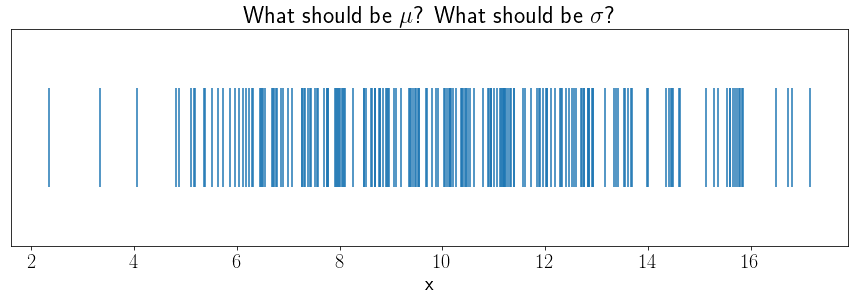

In [4]:
rc('font',size=20)
rc('text',usetex=True)
np.random.seed(0)
x = np.load('../data/bml_norm_x.npy')
plt.figure(figsize=(15,4))
plt.eventplot(x);
plt.yticks([]);plt.xlabel('x');
plt.title('What should be $\mu$? What should be $\sigma$?');

Let us visualize the pdf of Gaussian distribution by varying $\mu$ and $\sigma$.

In [5]:
def GaussianPDF(mu, sigma, x):
    return (1/np.sqrt(2*np.pi*sigma**2))*np.exp(-np.square(x-mu)/2/sigma**2)

rc('font',size=16)
rc('text',usetex=True)
fig, ax = plt.subplots(figsize=(10,4))
mu, sigma = 0, 10
def update(mu):
    np.random.seed(mu)
    ax.cla()
    x = np.sort(np.random.normal(mu, sigma, 100))
    pdfx = np.linspace(x.min(), x.max(), 100)
    G_pdf = GaussianPDF(mu, sigma, pdfx)
    ax.plot(pdfx, G_pdf,label='pdf')
    ax.plot(x, np.ones(x.shape[0])*-0.001, '|k', markersize=20)
    ax.vlines([mu+sigma, mu-sigma], *ax.get_ylim(), label='$\sigma$', linestyle='--')
    ax.vlines([mu+2*sigma, mu-2*sigma], *ax.get_ylim(), label='$2\sigma$', linestyle='--',color='r')
    ax.legend()
    ax.set_xlabel('x');ax.set_ylabel('pdf');
    ax.set_title(f'$\mu$ = {mu}, $\sigma$={sigma}');
    ax.set_xlim(-35,90)
    plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, update, frames=np.arange(1,60,5))
rc('animation',html='jshtml')
anim

<Figure size 432x288 with 0 Axes>

In [6]:
def GaussianPDF(mu, sigma, x):
    return (1/np.sqrt(2*np.pi*sigma**2))*np.exp(-np.square(x-mu)/2/sigma**2)

rc('font',size=16)
rc('text',usetex=True)
fig, ax = plt.subplots(figsize=(10,4))
mu, sigma = 0, 10
def update(sigma):
    np.random.seed(0)
    ax.cla()
    x = np.sort(np.random.normal(mu, sigma, 100))
    pdfx = np.linspace(x.min(), x.max(), 100)
    G_pdf = GaussianPDF(mu, sigma, pdfx)
    ax.plot(pdfx, G_pdf,label='pdf')
    ax.plot(x, np.ones(x.shape[0])*-0.001, '|k', markersize=20)
    ax.vlines([mu+sigma, mu-sigma], *ax.get_ylim(), label='$\sigma$', linestyle='--')
    ax.vlines([mu+2*sigma, mu-2*sigma], *ax.get_ylim(), label='$2\sigma$', linestyle='--',color='r')
    ax.legend()
    ax.set_xlabel('x');ax.set_ylabel('pdf');
    ax.set_title(f'$\mu$ = {mu}, $\sigma$={sigma}');
    ax.set_xlim(-35,35)
    ax.set_ylim(-0.02,0.12)
    plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, update, frames=np.arange(4,11))
rc('animation',html='jshtml')
anim

<Figure size 432x288 with 0 Axes>

### MLE estimate for the Gaussian distribution parameters

We draw N samples independently from a Gaussian distribution. $D=\{x_1, x_2, ..., x_N\}$

Let us estimate $\mu_{MLE}$ first,
### \begin{aligned}
p(D|\mu) &= \prod\limits_{i=1}^{N}\frac{1}{\sqrt{2\pi\sigma^2}}exp\left[{-\frac{(x_i-\mu)^2}{2\sigma^2}}\right]\\
\log p(D|\mu) &= -\frac{N}{2}\log(2\pi\sigma^2)-\frac{1}{2}\sum\limits_{i=1}^{N}\frac{(x_i-\mu)^2}{\sigma^2}\\
\frac{d}{d\mu}\log p(D|\mu) &= \sum\limits_{i=1}^{N}\frac{(x_i-\mu)}{\sigma^2} = 0\\
\\
\text{Follows that,}\\
\mu_{MLE} &= \frac{1}{N}\sum\limits_{i=1}^{N}x_i
\end{aligned}

#### Now, we will estimate $\sigma_{MLE}$,
### \begin{aligned}
p(D|\sigma) &= \prod\limits_{i=1}^{N}\frac{1}{\sqrt{2\pi\sigma^2}}exp\left[{-\frac{(x_i-\mu)^2}{2\sigma^2}}\right]\\
\log p(D|\sigma) &= -\frac{N}{2}\log(2\pi\sigma^2)-\frac{1}{2}\sum\limits_{i=1}^{N}\frac{(x_i-\mu)^2}{\sigma^2}\\
\frac{d}{d\sigma}\log p(D|\sigma) &= -\frac{N}{2}\frac{4\pi\sigma}{2\pi\sigma^2} + \sum\limits_{i=1}^{N}\frac{(x_i-\mu)^2}{\sigma^3} = 0\\
\\
\text{Follows that,}\\
\frac{N}{\sigma} &= \sum\limits_{i=1}^{N}\frac{(x_i-\mu)^2}{\sigma^3}\\
\sigma^2_{MLE} &= \frac{1}{N}\sum\limits_{i=1}^{N}(x_i-\mu)^2
\end{aligned}

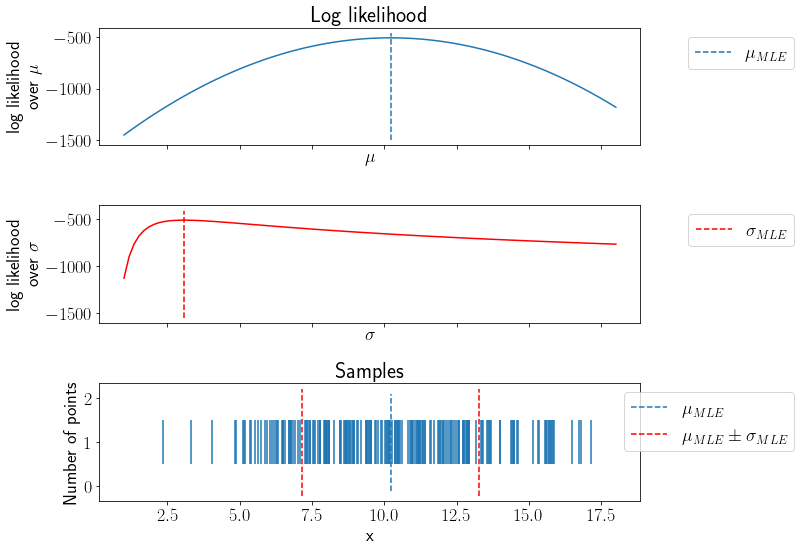

In [7]:
def LogGaussian(mu, sigma, x):
    return -0.5*np.log(2*np.pi*sigma**2)*x.shape[0] - 0.5*np.sum(np.square((x.squeeze()-mu)/sigma))
mu,sigma=10,3
np.random.seed(0)
x = np.load('../data/bml_norm_x.npy')
muR = np.linspace(1,18,100)
Lmu = [LogGaussian(mu, sigma, x) for mu in muR]
Lsigma = [LogGaussian(mu, sigma, x) for sigma in muR]

rc('font',size=18)
rc('text',usetex=True)
fig, ax = plt.subplots(3,1,figsize=(12,8), sharex=True)
ax[0].plot(muR, Lmu);ax[0].set_ylabel('log likelihood\nover $\mu$');
ax[1].plot(muR, Lsigma, color='r')
ax[1].set_ylabel('log likelihood\nover $\sigma$');
ax[0].set_title('Log likelihood');ax[0].set_xlabel('$\mu$');ax[1].set_xlabel('$\sigma$');
ax[0].vlines(np.mean(x), *ax[0].get_ylim(), linestyle='--',label='$\mu_{MLE}$')
ax[1].vlines(np.std(x), *ax[0].get_ylim(), linestyle='--',label='$\sigma_{MLE}$',color='r')
ax[2].eventplot(x);ax[2].set_xlabel('x');ax[2].set_ylabel('Number of points');
ax[2].vlines(np.mean(x), *ax[2].get_ylim(), linestyle='--',label='$\mu_{MLE}$')
ax[2].vlines([np.mean(x)-np.std(x),np.mean(x)+np.std(x)], *ax[2].get_ylim(), linestyle='--',label='$\mu_{MLE}\pm\sigma_{MLE}$',color='r')
ax[2].set_title('Samples');
for axs in ax:
    axs.legend(bbox_to_anchor=(1.3,1));
plt.tight_layout();

## Q: What is the difference between pdf/pmf and likelihood?

### Poisson distribution

A discrete random variable is called Poisson distributed if it follows the below pmf,
$$
p(x|\lambda) = \frac{\lambda^xe^{-\lambda}}{x!}
$$

Wonder how this formula is derived? checkout https://www.youtube.com/watch?v=7cg-rxofqj8

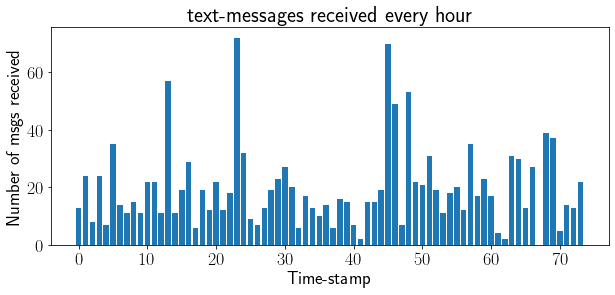

In [8]:
msg = np.loadtxt('https://raw.githubusercontent.com/CamDavidsonPilon/Probabilistic-Programming-and-Bayesian-Methods-for-Hackers/master/Chapter1_Introduction/data/txtdata.csv')
plt.figure(figsize=(10,4))
plt.bar(range(len(msg)),msg);
plt.title('text-messages received every hour');
plt.xlabel('Time-stamp');plt.ylabel('Number of msgs received');

### Other applications
1. Telephone calls arriving in a system
1. Customers arriving at a counter
1. The number of photons emitted in a single laser pulse

And many more on [Wikipedia](https://en.wikipedia.org/wiki/Poisson_distribution)

In [9]:
def Poisson(lmd, k):
    return lmd**k*np.exp(-lmd)/np.math.factorial(int(k))

k = np.arange(21)
rc('font',size=14)
fig, axs = plt.subplots(1,2,figsize=(12,5))
ax, ax1 = axs
def update(lmd):
    np.random.seed(0)
    ax.cla();ax1.cla()
    P_pdf = [Poisson(lmd, ki) for ki in k]
    ax.plot(k, P_pdf,'o-',label='pmf')
    ax.set_xlabel('x');ax.set_ylabel('pmf');
    ax.set_title(f'lambda = {lmd}')
    ax.set_ylim(0,0.4);
    ax.legend();
    
    ax1.bar(range(20), np.random.poisson(lam=lmd, size=20))
    ax1.set_title('Samples')
    ax1.set_ylim(0,20);
plt.close()
anim = FuncAnimation(fig, update, frames=np.arange(1,11))
rc('animation',html='jshtml')
anim

### MLE estimate for the Poisson distribution parameters

We draw N samples independently from a Poisson distribution. $D=\{x_1, x_2, ..., x_N\}$

\begin{aligned}
p(D|\lambda) &= \prod\limits_{i=1}^{N}\frac{\lambda^{x_i}e^{-\lambda}}{x_i!}\\
\log p(D|\lambda) &= \sum\limits_{i=1}^{N}\log(\lambda^{x_i})+\sum\limits_{i=1}^{N}\log(e^{-
\lambda})-\sum\limits_{i=1}^{N}\log(x_i!)\\
\frac{d}{d\lambda}\log p(D|\lambda) &= \frac{\sum\limits_{i=1}^{N}x_i}{\lambda} - \sum\limits_{i=1}^{N}1 = 0\\
\lambda_{MLE} &= \frac{1}{N}\sum\limits_{i=1}^{N}x_i
\end{aligned}

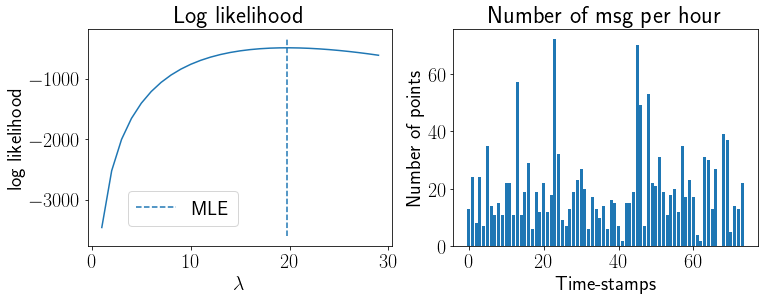

In [10]:
np.random.seed(123)
x = msg
L = [np.sum([np.log(Poisson(lmdi, xi)) for xi in x]) for lmdi in range(1,30)]
rc('font',size=20)
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(range(1,30), L);ax[0].set_xlabel('$\lambda$');ax[0].set_ylabel('log likelihood');
ax[0].set_title('Log likelihood');
ax[0].vlines(np.mean(x), *ax[0].get_ylim(), linestyle='--',label='MLE')
ax[1].bar(range(len(msg)), msg);ax[1].set_xlabel('Time-stamps');ax[1].set_ylabel('Number of points');
ax[1].set_title('Number of msg per hour');
ax[0].legend(bbox_to_anchor=(0.1,0.3));

## Bayesian linear regression (1D without bias)

#### We know the formulation of the simple linear regression for $\mathbf{x}=\{x_1,x_2,..,x_N\}$ and $\mathbf{y}=\{y_1,y_2,..,y_N\}$,
### $$
\mathbf{y} = \theta\mathbf{x} + \boldsymbol{\epsilon}
$$

#### In probabilistic world, we can define the Gaussian distributions over the noise parameter as following,
### $$
\boldsymbol{\epsilon} \sim \mathcal{N}(0, I\sigma_n^2)
$$
### $$p(\mathbf{y}|\theta) \sim \mathcal{N}(\theta\mathbf{x}, I\sigma_n^2)$$

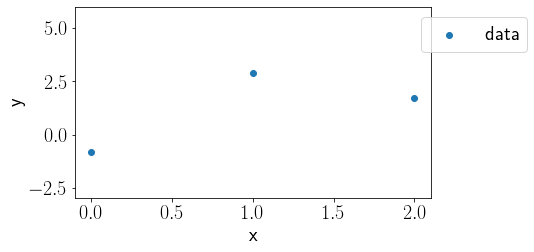

In [11]:
np.random.seed(2)
rc('font',size=20)
plt.figure(figsize=(8,4))
N = 3
x = np.linspace(0,2,N).reshape(-1,1)
t = 3
sigma_n = 2
y = t*x + np.random.multivariate_normal(np.zeros(N), np.eye(N)*sigma_n**2).reshape(-1,1)
plt.scatter(x, y, label='data');plt.xlabel('x');plt.ylabel('y');
plt.ylim(-3,6);plt.legend(bbox_to_anchor=(1.3,1));
plt.tight_layout()

Now, we should be able to appreciate the effectiveness of MLE as we can find such $\theta$ so that our likelihood of observing given data $D=\mathbf{y}$ is maximized.

### \begin{aligned}
p(D|\theta) &= \frac{1}{\sqrt{(2\pi)^N}\sigma_n^N}exp\left[-\frac{1}{2}(\mathbf{y}-\theta\mathbf{x})^T(I\sigma_n^2)^{-1}(\mathbf{y}-\theta\mathbf{x})\right] \\
\log p(D|\theta) &= -\frac{N}{2}\log(2\pi\sigma_n^2) - \sum\limits_{i=1}^{N}\frac{(y_i - \theta x_i)^2}{2\sigma_n^2}\\
argmin -\log p(D|\theta)&= argmin \sum\limits_{i=1}^{N}(y_i - \theta x_i)^2\\
\end{aligned}
This turns out as the same cost function in linear regression.

### \begin{aligned}
\frac{d}{d\theta} \log p(D|\theta) &= \sum\limits_{i=1}^{N}\frac{(y_i - \theta x_i)x_i}{\sigma_n^2} = 0\\
\theta_{MLE} &= \frac{\sum\limits_{i=1}^{N}y_ix_i}{\sum\limits_{i=1}^{N}x_i^2}
\end{aligned}

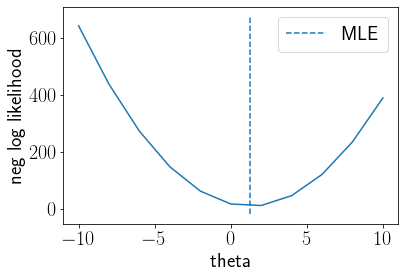

In [12]:
def loglin(t1):
    N = x.shape[0]
    return -(N/2)*jnp.log(2*jnp.pi*sigma_n**2) - jnp.sum(jnp.square(y-t1*x))

T = np.linspace(-10,10,11)
LL = [-loglin(t1) for t1 in T]
fig, ax = plt.subplots()
ax.plot(T, LL);
ax.vlines(np.sum(x*y)/np.sum(np.square(x)),*ax.get_ylim(),linestyle='--',label='MLE')
ax.set_xlabel("theta");ax.set_ylabel("neg log likelihood");
plt.legend(bbox_to_anchor=[1,1]);

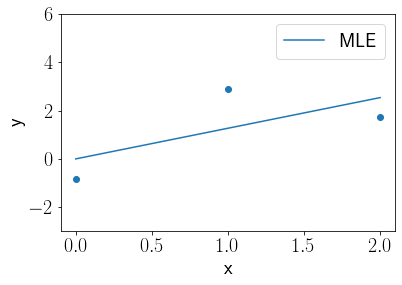

In [13]:
np.random.seed(1)
rc('font',size=20)
plt.scatter(x, y);plt.xlabel('x');plt.ylabel('y');
t_mle = np.sum(x*y).squeeze()/np.sum(np.square(x)).squeeze()
plt.plot(x, t_mle*x, label='MLE');plt.ylim(-3,6);
plt.legend();

#### Gradient descent is illustrated below.

In [14]:
costs = []
thetas = []
theta = 10.
lr = 0.02

grad_func = grad(loglin)
for iteration in range(20):
    dt = -grad_func(theta)
    theta = theta - lr*dt
    costs.append(-loglin(theta))
    thetas.append(theta)
rc('font',size=14)
fig,ax = plt.subplots(1,2,figsize=(10,4))
def update(i):
    ax[1].cla();ax[0].cla();
    ax[0].plot(T, LL,color='b')
    ax[0].set_xlabel('theta');ax[0].set_ylabel('neg log likelihood');
    ax[0].scatter(thetas[:i+1], costs[:i+1], label='solution',c='r')
    ax[0].legend()
    ax[1].scatter(x,y)
    ax[1].plot(x, thetas[i]*x, label='estimated fit')
    ax[1].set_xlabel('x');ax[1].set_ylabel('y');
    ax[1].legend()
    ax[1].set_ylim(-5,16);
    plt.tight_layout()
# plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, update, range(20))
anim

<Figure size 432x288 with 0 Axes>

## You should trust MLE with a caution..!!
![MAP](https://raw.githubusercontent.com/patel-zeel/Adhoc/master/images/MAP.jpg)

## Bayes Rule: New evidence does not completely determine the new belief but it updates the prior belief.
* According to MLE,
    * ### $D=\{H,H,H,H\} \to \theta_{MLE}=1$ 
    
    * ### $D=\{H,T,T,H\} \to \theta_{MLE}=0.5$
    
    * ### $D=\{T,T,T,T\} \to \theta_{MLE}=0$

### Thus, we need to consider a prior belief in our parameter estimation

# Prior beliefs over parameters 

### Beta distribution

### $$
p(\theta|\alpha, \beta) = \frac{\theta^{\alpha-1}(1-\theta)^{\beta-1}}{B(\alpha,\beta)}, \alpha,\beta>0\\
B(\alpha, \beta) = \frac{\Gamma(\alpha)\Gamma(\beta)}{\Gamma(\alpha+\beta)}\\
\Gamma(\alpha) = (\alpha-1)!
$$

In [15]:
theta = np.linspace(0,1,50)
alp = np.linspace(1,5,10).tolist() + np.linspace(5,5,10).tolist() + np.linspace(5,1,10).tolist() + np.linspace(1,10,10).tolist() + np.linspace(10,1,10).tolist() + np.linspace(1,0.1,10).tolist()
bet = np.linspace(5,5,10).tolist() + np.linspace(5,1,10).tolist() + np.linspace(1,1,10).tolist() + np.linspace(1,10,10).tolist() + np.linspace(10,1,10).tolist() + np.linspace(1,0.1,10).tolist()

fig, ax = plt.subplots(figsize=(6,5))
def update(i):
    ax.cla()
    ax.plot(theta, scipy.stats.beta.pdf(theta, alp[i], bet[i]))
    ax.set_title(f'$\\alpha$={np.round(alp[i],2)}, $\\beta$ = {np.round(bet[i],2)}')
    ax.set_ylim(0,6);
    ax.set_xlabel('$\\theta$');ax.set_ylabel('pdf');
    plt.tight_layout()

plt.close()
anim = FuncAnimation(fig, update, range(len(alp)))
anim

<Figure size 432x288 with 0 Axes>

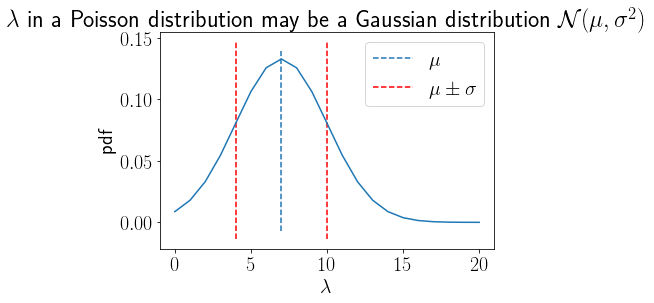

In [16]:
x = np.linspace(0,20,21)
Gaussprior = GaussianPDF(7, 3, x)
rc('font',size=20)
plt.plot(x, Gaussprior);
plt.vlines(7,*plt.gca().get_ylim(), linestyle='--', label='$\mu$')
plt.vlines([7-3,7+3],*plt.gca().get_ylim(), linestyle='--', label='$\mu\pm\sigma$',color='r')
plt.title('$\lambda$ in a Poisson distribution may be a Gaussian distribution $\mathcal{N}(\mu,\sigma^2)$');
plt.xlabel('$\lambda$');plt.ylabel('pdf');
plt.legend();

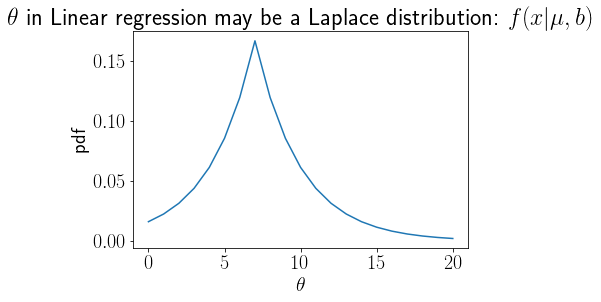

In [17]:
def LaplacePDF(mu, b, x):
    return (1/2/b)*np.exp(-np.abs(x - mu)/b)

x = np.linspace(0,20,21)
Laplaceprior = LaplacePDF(7, 3, x)
rc('font',size=20)
plt.plot(x, Laplaceprior);
plt.title('$\\theta$ in Linear regression may be a Laplace distribution: $f(x|\mu,b)$');
plt.xlabel('$\\theta$');plt.ylabel('pdf');

## How to choose appropriate prior for likelihood? $\to$ Conjugate priors

### We choose a conjugate prior to likelihood to ensure the same distribution in posterior as prior

### Example 1: Bernoulli likelihood $\to$ Beta prior $\to$ Beta posterior 
### Example 2: Gaussian likelihood $\to$ Gaussian prior $\to$ Gaussian posterior 

More info on conjugate priors is at https://en.wikipedia.org/wiki/Conjugate_prior

### Maximum A Posteriori (MAP) estimation

### \begin{aligned}
p(\theta_{posterior}|D) &= \frac{p(D|\theta_{prior})}{p(D)}p(\theta_{prior})\\
p(D) \text{ can be treated as a constant}\\
p(\theta_{posterior}|D) &\propto p(D|\theta_{prior})p(\theta_{prior}) 
\end{aligned}

### $$
\text{MLE: }\arg\max_\theta \; p(D|\theta)\\
\text{MAP: }\arg\max_\theta \; p(\theta|D) = \arg\max_\theta \; p(D|\theta)p(\theta)
$$

## MAP for coin flip experiment

#### We assume $p(\theta) \sim Beta(\alpha, \beta)$

### \begin{aligned}
p(\theta|D)p(\theta) &= \theta^h(1-\theta)^{N-h}\cdot\frac{\theta^{\alpha-1}(1-\theta)^{\beta-1}}{B(\alpha, \beta)}\\
                     &= \frac{\theta^{h+\alpha-1}(1-\theta)^{N-h+\beta-1}}{B(\alpha, \beta)}\\
\log p(\theta|D)p(\theta) &= (h+\alpha-1)\log(\theta) + (N-h+\beta-1)\log(1-\theta) - \log(B(\alpha, \beta))\\
\\
\frac{d}{d\theta} \log p(\theta|D)p(\theta) &= \frac{h+\alpha-1}{\theta} - \frac{N-h+\beta-1}{1-\theta} = 0\\
\\
\theta_{MAP} &= \frac{h+(\alpha-1)}{N+(\alpha-1)+(\beta-1)}
\end{aligned}

In [18]:
N,h = 10,8
theta = np.linspace(0.01,0.99,100)
BL = [Bernoulli(t,N,h) for t in theta]
BLM = BernoulliModified(theta,N,h)
LogBL = LogBernoulli(theta,N,h)
rc('font',size=20)
rc('text',usetex=True)
fig, ax = plt.subplots(figsize=(10,4))
axs = ax.twinx()
def update(i):
    ax.cla();axs.cla();
    axs.set_ylim(-0.02,5)
    al,be = alp[i], bet[i]
    ax.plot(theta, BL, label='Likelihood');
    axs.plot(theta, scipy.stats.beta.pdf(theta, al,be), label='Prior',color='k');
    ax.set_xlabel('$\\theta$');
    ax.vlines(0.8, *ax.get_ylim(), linestyle='--',label='MLE')
    ax.text(0.8,0,'MLE')
    ax.text(theta[0], BL[0],'Likelihood')
    axs.text(theta[0], scipy.stats.beta.pdf(theta, al,be)[0],'Prior')
    axs.text(0.4,2,'Prior mean')
    axs.text((h+al-1)/(N+al+be-2),1,'MAP')
    ax.vlines(0.5, *ax.get_ylim(), linestyle='--',label='Prior mean',color='k')
    ax.vlines((h+al-1)/(N+al+be-2), *ax.get_ylim(), linestyle='--',label='MAP',color='r')
    ax.set_title('D=\{H,T,H,H,H,H,T,H,H,H\}, $\\alpha = '+str(np.round(al,2))+'$, $\\beta='+str(np.round(be,2))+'$');
    # ax.set_yscale('log');
#     ax.legend(bbox_to_anchor=(1,1));axs.legend(bbox_to_anchor=(1.25,0.6));
plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, update, range(len(alp)))
anim

## MAP for linear regression

For linear regression problem, let us assume our theta as a Gaussian distribution beucase our likelihood is Gaussian.

\begin{align}
p(\theta) \sim \mathcal{N}(0,\sigma^2)
\end{align}

In [19]:
fig,ax = plt.subplots(1,2,figsize=(10,4))
np.random.seed(2)
N = 3
x = np.linspace(0,2,N).reshape(-1,1)
t = 3
sigma_n = 2
y = t*x + np.random.multivariate_normal(np.zeros(N), np.eye(N)*sigma_n**2).reshape(-1,1)
sigma = 1
samples = np.random.normal(0,sigma,size=10)
thetap = np.linspace(-2,2,20)
def update(i):
    for axs in ax:
        axs.cla()
    ax[0].plot(thetap, GaussianPDF(0, sigma, thetap))
    ax[0].set_xlabel('theta');ax[0].set_ylabel('pdf');
    ax[0].scatter(samples[i], GaussianPDF(0, sigma, samples[i]), label='sample')
    ax[0].legend()
    ax[1].scatter(x,y)
    ax[1].plot(x, samples[i]*x, label='prior fit')
    ax[1].set_xlabel('x');ax[1].set_ylabel('y');
    ax[1].legend()
    ax[1].set_ylim(-4,16);
    ax[0].set_xlim(-2,2);
#     plt.tight_layout()
plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, update, range(10))
anim

Now, we will find MAP estimate incorporating the prior.

\begin{aligned}
p(\theta|D) \propto p(D|\theta)p(\theta) &= \frac{1}{\sqrt{(2\pi)^N}\sigma_n^N}exp\left[-\frac{1}{2}(\mathbf{y}-\theta\mathbf{x})^T(I\sigma_n^2)^{-1}(\mathbf{y}-\theta\mathbf{x})\right] \frac{1}{\sqrt{2\pi\sigma^2}}exp\left[{-\frac{(\theta-0)^2}{2\sigma^2}}\right]
\\
\log [p(D|\theta)p(\theta)] &= -\frac{N}{2}\log(2\pi\sigma_n^2) - \sum\limits_{i=1}^{N}\frac{(y_i - \theta x_i)^2}{2\sigma_n^2} - \frac{1}{2}\log(2\pi\sigma^2)-\frac{\theta^2}{2\sigma^2}\\
\frac{d}{d\theta}\log [p(D|\theta)p(\theta)] &=  \sum\limits_{i=1}^{N}\frac{(y_i - \theta x_i)x_i}{\sigma_n^2} - \frac{\theta}{\sigma^2} = 0\\
\theta_{MAP} &= \frac{\sum\limits_{i=1}^{N}y_ix_i}{\sum\limits_{i=1}^{N}x_i^2 + \frac{\sigma_n^2}{\sigma^2}}
\end{aligned}

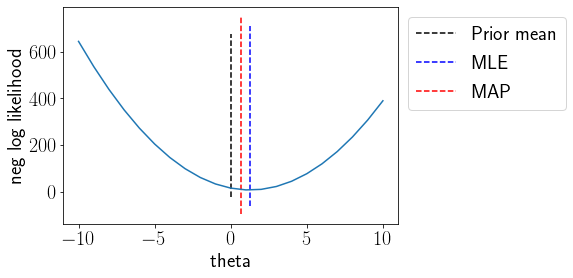

In [20]:
def loglin(t1):
    N = x.shape[0]
    return -(N/2)*jnp.log(2*jnp.pi*sigma_n**2) - jnp.sum(jnp.square(y-t1*x))

T = np.linspace(-10,10,21)
LL = [-loglin(t1) for t1 in T]
fig, ax = plt.subplots()
ax.plot(T, LL);
ax.vlines(0,*ax.get_ylim(),linestyle='--',label='Prior mean',color='k')
ax.vlines(np.sum(x*y)/np.sum(np.square(x)),*ax.get_ylim(),linestyle='--',label='MLE',color='b')
ax.vlines(np.sum(x*y)/(np.sum(np.square(x))+(sigma_n**2/sigma**2)),*ax.get_ylim(),linestyle='--',label='MAP',color='r')
ax.set_xlabel("theta");ax.set_ylabel("neg log likelihood");
plt.legend(bbox_to_anchor=[1,1]);

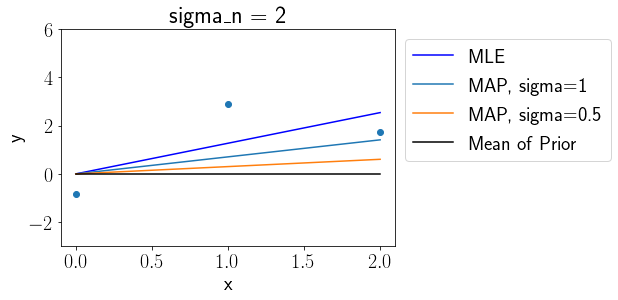

In [21]:
np.random.seed(1)
rc('font',size=20)
plt.scatter(x, y);plt.xlabel('x');plt.ylabel('y');
t_mle = np.sum(x*y)/np.sum(np.square(x))
plt.plot(x, t_mle*x, label='MLE', color='b')
t_map = np.sum(x*y)/(np.sum(np.square(x))+(sigma_n**2/sigma**2))
plt.plot(x, t_map*x, label=f'MAP, sigma={sigma}')
t_map = np.sum(x*y)/(np.sum(np.square(x))+(sigma_n**2/0.5**2))
plt.plot(x, t_map*x, label=f'MAP, sigma={0.5}')
plt.plot(x, 0*x, label='Mean of Prior', color='k')
plt.ylim(-3,6);
plt.legend(bbox_to_anchor=(1,1));
plt.title(f'sigma\_n = {sigma_n}');

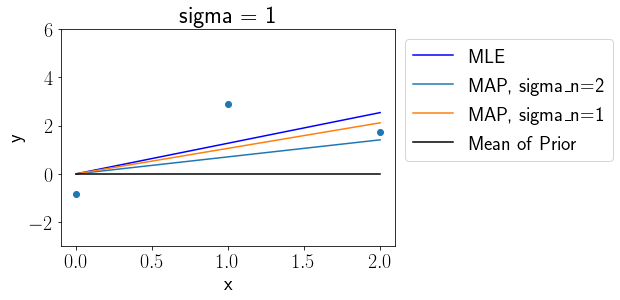

In [22]:
np.random.seed(1)
rc('font',size=20)
plt.scatter(x, y);plt.xlabel('x');plt.ylabel('y');
t_mle = np.sum(x*y)/np.sum(np.square(x))
plt.plot(x, t_mle*x, label='MLE',color='b')
t_map = np.sum(x*y)/(np.sum(np.square(x))+(sigma_n**2/sigma**2))
plt.plot(x, t_map*x, label=f'MAP, sigma\_n={sigma_n}')
t_map = np.sum(x*y)/(np.sum(np.square(x))+(1**2/1**2))
plt.plot(x, t_map*x, label=f'MAP, sigma\_n={1}')
plt.plot(x, 0*x, label='Mean of Prior', color='k')
plt.ylim(-3,6);
plt.legend(bbox_to_anchor=(1,1));
plt.title(f'sigma = {sigma}');

### Bayesian linear regression (1D with bias term)

Now, we will programatically explore MLE and MAP for 1D linear regression after including the bias term.

\begin{aligned}
\mathbf{\theta}_{MLE} &= (X^TX)^{-1}X^T\mathbf{y}\\
\\
\mathbf{\theta}_{MAP} &= (X^TX + I\frac{\sigma_n^2}{\sigma^2})^{-1}X^T\mathbf{y}
\end{aligned}

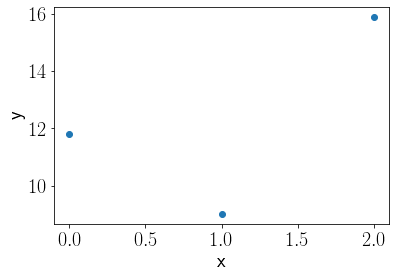

In [23]:
np.random.seed(0)
N = 3
x = np.linspace(0,2,N).reshape(-1,1)
sigma_n = 2
rc('font',size=20)
t0, t1 = 3, 4
sigma_n = 5
y = t0 + t1*x + np.random.multivariate_normal(np.zeros(N), np.eye(N)*sigma_n**2).reshape(-1,1)
plt.scatter(x, y);plt.xlabel('x');plt.ylabel('y');

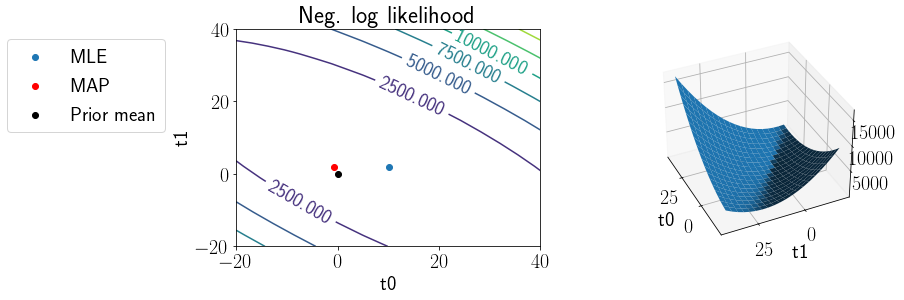

In [24]:
def LogLin2D(t0, t1):
    N = x.shape[0]
    return (N/2)*jnp.log(2*jnp.pi*sigma_n**2) + jnp.sum(jnp.square(y-t0-t1*x))

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121)

T0, T1 = np.meshgrid(np.linspace(-20,40,20), np.linspace(-20,40,20))
Z = np.array([LogLin2D(t00, t11) for t00, t11 in zip(T0.ravel(), T1.ravel())]).reshape(*T0.shape)
mp = ax.contour(T0, T1, Z);
plt.clabel(mp);
ax.set_xlabel('t0');ax.set_ylabel('t1');
ax.set_title('Neg. log likelihood');
x_extra = np.hstack([np.ones((x.shape[0], 1)), x])
t0_mle, t1_mle = np.linalg.inv(x_extra.T@x_extra)@x_extra.T@y
t0_map, t1_map = np.linalg.inv(x_extra.T@x_extra + np.eye(x.shape[1])*(sigma_n**2/sigma**2))@x_extra.T@y
# ax.annotate('GT', (t0, t1))
ax.scatter(t0_mle, t1_mle, label='MLE');
# ax.annotate('MLE', (t0_mle, t1_mle))
ax.scatter(t0_map, t1_map, label='MAP',c='r');
# ax.annotate('MAP', (t0_map, t1_map))
ax.scatter(0, 0, label='Prior mean',c='k');
# ax.text(-4,0, 'Prior mean')
ax.legend(bbox_to_anchor=(-0.2,1))

ax = fig.add_subplot(122, projection='3d')
ax.plot_surface(T0, T1, Z);
ax.view_init(35, 90+65);
ax.set_xlabel('t0');ax.set_ylabel('t1');

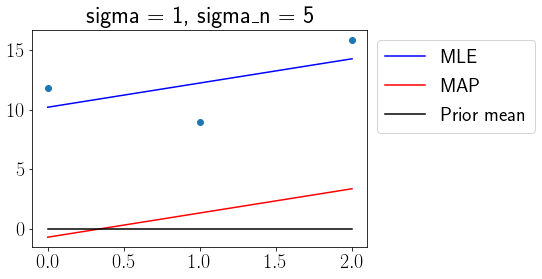

In [25]:
plt.scatter(x,y);
plt.plot(x, t0_mle+t1_mle*x, label='MLE',color='b')
plt.plot(x, t0_map+t1_map*x, label='MAP',color='r')
plt.plot(x, 0*x, label='Prior mean',color='k')
plt.title(f'sigma = {sigma}, sigma\_n = {sigma_n}')
plt.legend(bbox_to_anchor=(1,1));

### Another case

In [26]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(131)
ax1 = fig.add_subplot(132)
ax2 = fig.add_subplot(133, projection='3d')
sigma, sigma_n = 1, 2
def update(N):
    ax.cla();ax1.cla();ax2.cla()
    np.random.seed(1)
    x = np.linspace(0,2,N).reshape(-1,1)
    y = t0 + t1*x + np.random.multivariate_normal(np.zeros(N), np.eye(N)*sigma_n**2).reshape(-1,1)
    x_extra = np.hstack([np.ones((x.shape[0], 1)), x])
    t0_mle, t1_mle = np.linalg.inv(x_extra.T@x_extra)@x_extra.T@y
    t0_map, t1_map = np.linalg.inv(x_extra.T@x_extra + np.eye(x.shape[1])*(sigma_n**2/sigma**2))@x_extra.T@y

    ax.scatter(x,y);
    ax.plot(x, t0_mle+t1_mle*x, label='MLE',color='b')
    ax.plot(x, t0_map+t1_map*x, label='MAP',color='r')
    ax.plot(x, 0*x, label='Prior mean',color='k')
    ax.set_ylim(-1,15)
    ax.set_title(f'sigma = {sigma}, sigma\_n = {sigma_n}')
    ax.legend(loc='upper left');
    ax.set_xlabel('x');ax.set_ylabel('y')
    
    T0, T1 = np.meshgrid(np.linspace(-20,20,50), np.linspace(-20,20,50))
    Z = np.array([LogLin2D(t00, t11) for t00, t11 in zip(T0.ravel(), T1.ravel())]).reshape(*T0.shape)
    mp = ax1.contour(T0, T1, Z, levels=15);
    ax.clabel(mp);
    ax1.scatter(t0_mle, t1_mle, label='MLE', c='b');
    # ax.annotate('MLE', (t0_mle, t1_mle))
    ax1.scatter(t0_map, t1_map, label='MAP', c='r');
    # ax.annotate('MAP', (t0_map, t1_map))
    ax1.scatter(0, 0, label='Prior mean',c='k');
    ax1.set_xlabel('$\\theta_0$');ax1.set_ylabel('$\\theta_1$',labelpad=-12);
    ax1.set_title('Neg. log likelihood');
    
    ax2.contour3D(T0, T1, Z, levels=40);
    ax2.scatter(t0_mle, t1_mle, label='MLE', c='b');
    # ax.annotate('MLE', (t0_mle, t1_mle))
    ax2.scatter(t0_map, t1_map, label='MAP', c='r');
    # ax.annotate('MAP', (t0_map, t1_map))
    ax2.scatter(0, 0, label='Prior mean',c='k');
    ax2.view_init(35, 15+90);
    ax2.set_xlabel('$\\theta_0$');ax2.set_ylabel('$\\theta_1$');
    
    plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, update, range(2,21))
anim

<Figure size 432x288 with 0 Axes>

# Evidence $p(D)$

### Note that we discussed about likelihood and prior, if we get evidence as well, we can get the posterior distribution. 

### $$
p(D) = \int\limits_{\theta}p(D|\theta)d\theta
$$

### Another use of evidence is model comparison. For different models, higher value of $p(D)$ suggests better model.

### $$
BF = \frac{p(D|M1)}{p(D|M2)}
$$

### In practive, evidence is hard to calculate because of non-trivial intigration over $\theta$. But, sometimes it is possible to derive

# Full posterior prediction for coin toss experiment

### $$
p(\theta|D) = \frac{p(D|\theta)p(\theta)}{p(D)}
$$
### \begin{aligned}
p(D) &= \int\limits_{0}^{1}p(D|\theta)d\theta\\
     &= \int\limits_{0}^{1}(\theta)^h(1-\theta)^{N-h}d\theta\\
     &= \frac{h!(N-h)!}{(N+1)!}
\end{aligned}

### \begin{aligned}
p(\theta|D) = \frac{(N+1)!}{h!(N-h)!}\frac{\theta^{h+\alpha-1}(1-\theta)^{N-h+\beta-1}}{B(\alpha, \beta)}
\end{aligned}

In [27]:
from scipy.special import gamma
def PostPDF(theta,al,be):
    ft = np.math.factorial(N+1)/np.math.factorial(h)/np.math.factorial(N-h)
    st = (theta**(h+al-1))*((1-theta)**(N-h+be-1))
    tt = gamma(al+be)/(gamma(al)*gamma(be))
    return ft*st*tt

N,h = 10,8
theta = np.linspace(0.01,0.99,100)
BL = [Bernoulli(t,N,h) for t in theta]
BLM = BernoulliModified(theta,N,h)
LogBL = LogBernoulli(theta,N,h)
rc('font',size=20)
rc('text',usetex=True)
fig, ax = plt.subplots(figsize=(10,4))
axs = ax.twinx()
def update(i):
    ax.cla();axs.cla()
    axs.set_ylim(-0.02,5)
    al,be = alp[i], bet[i]
    ax.plot(theta, BL, label='Likelihood');
    axs.plot(theta, scipy.stats.beta.pdf(theta, al,be), label='Prior',color='k');
    ax.set_xlabel('$\\theta$');
    ax.vlines(0.8, *ax.get_ylim(), linestyle='--',label='MLE')
    axs.text(0.8,2,'MLE')
    
    axs.plot(theta, [PostPDF(t,al,be) for t in theta], color='r')
    ax.text(theta[0], BL[0],'Likelihood')
    axs.text(theta[0], scipy.stats.beta.pdf(theta, al,be)[0],'Prior')
    axs.text(0.4,2,'Prior mean')
    axs.text(theta[0],PostPDF(theta[0],al,be),'Posterior')
    axs.text((h+al-1)/(N+al+be-2),1,'MAP')
    ax.vlines(0.5, *ax.get_ylim(), linestyle='--',label='Prior mean',color='k')
    ax.vlines((h+al-1)/(N+al+be-2), *ax.get_ylim(), linestyle='--',label='MAP',color='r')
    ax.set_title('D=\{H,T,H,H,H,H,T,H,H,H\}, $\\alpha = '+str(np.round(al,2))+'$, $\\beta='+str(np.round(be,2))+'$');
    # ax.set_yscale('log');
#     ax.legend(bbox_to_anchor=(1,1));axs.legend(bbox_to_anchor=(1.25,0.6));
plt.tight_layout()
plt.close()
anim = FuncAnimation(fig, update, range(len(alp)))
anim

### Logistic regression (classification)

Let us define logistic regression in the probabilistic world. Our output is $\mathbf{y}\in\{0,1\}$, so Bernoulli likelihood is appropriate here, if $\mathbf{y}=\{y_1, y_2, ..., y_N\}$, where number of ones = $n$ and number of zeros = $N-n$

### \begin{aligned}
h(\mathbf{x}) &= \theta_0 + \theta_1\mathbf{x}\\
\boldsymbol{\lambda} &= \frac{e^{h(\mathbf{x})}}{1+e^{h(\mathbf{x})}}\\
p(\mathbf{y}|\boldsymbol{\lambda}) &= \prod\limits_{i=1}^{N}\left[\lambda_i^{y_i} + (1-\lambda_i)^{1-y_i}\right]
\\
\log p(\mathbf{y}|\boldsymbol{\lambda}) &= \sum\limits_{i=1}^{N}\left[y_i\log(\lambda_i) + (1-y_i)\log(1-\lambda_i)\right]
\end{aligned}

### MLE

### \begin{aligned}
\text{For }\theta_0,\\
\log p(\mathbf{y}|\boldsymbol{\lambda}) &= \sum\limits_{i=1}^{N}\left[y_i\log(\lambda_i) + (1-y_i)\log(1-\lambda_i)\right]\\
\frac{d}{d\theta_0}\log p(\mathbf{y}|\boldsymbol{\lambda}) &= \sum\limits_{i=1}^{N}\left[y_i(1 -\lambda_i) - (1-y_i)\lambda_i\right]\\
&= \sum\limits_{i=1}^{N}\left[y_i-\lambda_i\right] = 0
\end{aligned}

### \begin{aligned}
\text{For }\theta_1,\\
\frac{d}{d\theta_1}\log p(\mathbf{y}|\boldsymbol{\lambda})&= \sum\limits_{i=1}^{N}\left[y_i-\lambda_i\right]x_i = 0
\end{aligned}

#### Closed form of MLE is not possible
### We can employ numerical methods such as MCMC and directly compute the posterior

In [28]:
from sklearn.datasets import make_blobs

In [29]:
np.random.seed(0)
X, y = make_blobs(n_samples=200, n_features=2,cluster_std=0.5, centers=2)

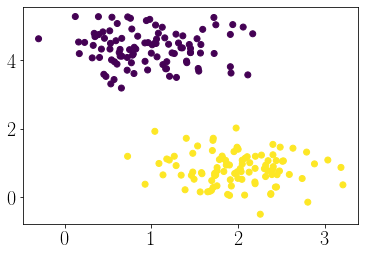

In [30]:
plt.scatter(X[:, 0], X[:, 1],c=y)

In [31]:
X_concat = np.hstack((np.ones((len(y), 1)), X))
X_concat.shape

(200, 3)

In [32]:
# !pip install -qq pymc3
import seaborn as sns
import pymc3 as pm
import arviz as az
import theano.tensor as tt

In [33]:
basic_model = pm.Model()

with basic_model:

    # Priors for unknown model parameters
    theta = pm.Normal("theta",mu=0,sigma=100, shape=3)
    #theta = pm.Uniform("theta", upper=50, lower=-50, shape=3)
    X_ = pm.Data('features', X_concat)
    # Expected value of outcome
    
    lmd = pm.math.sigmoid(tt.dot(X_, theta))
    
    # Likelihood (sampling distribution) of observations
    Y_obs = pm.Bernoulli("Y_obs", p=lmd, observed=y)

In [34]:
map_estimate = pm.find_MAP(model=basic_model)

In [35]:
map_estimate

{'theta': array([20.12421332,  3.69334159, -9.60226941])}

In [36]:
#separating hyperplane; X\theta = 0
def hyperplane(x, theta): 
    return (-theta[1]*x-theta[0]) /(theta[2])

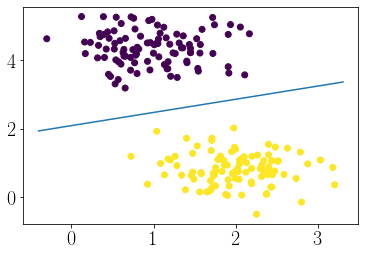

In [37]:
x = np.linspace(X[:, 0].min()-0.1, X[:, 0].max()+0.1, 100)
plt.plot(x, hyperplane(x, map_estimate['theta']))
plt.scatter(X[:, 0], X[:, 1],c=y)

In [38]:
with basic_model:
    # draw 500 posterior samples
    trace = pm.sample(5000,return_inferencedata=False,tune=1000)

ERROR:pymc3:There were 2563 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc3:There were 1554 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc3:There were 2379 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc3:There were 2015 divergences after tuning. Increase `target_accept` or reparameterize.


/home/patel_zeel/anaconda3/lib/python3.8/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'theta'}>,
        <AxesSubplot:title={'center':'theta'}>]], dtype=object)

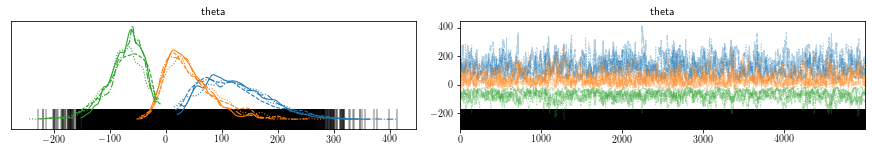

In [39]:
az.plot_trace(trace)

In [40]:
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

In [41]:
X_test = np.c_[xx.ravel(), yy.ravel()]
X_test_concat = np.hstack((np.ones((len(X_test), 1)), X_test))
X_test_concat.shape

(4368, 3)

In [42]:
with basic_model:
    pm.set_data({'features': X_test_concat})
    posterior = pm.sample_posterior_predictive(trace)

In [43]:
Z = posterior['Y_obs']

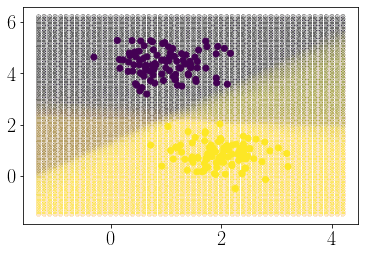

In [44]:
plt.figure()
for i in range(len(Z))[:50]:
#     plt.contour(xx, yy, Z[i].reshape(xx.shape), alpha=0.01)
    plt.scatter(xx.ravel(), yy.ravel(), c=Z[i].ravel(), s=20,alpha=0.005)
plt.scatter(X[:, 0], X[:, 1],c=y, zorder=10);